## Passo 0 - Importando bibliotecas

In [223]:
# Pacotes padrao
import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import itertools
from datetime import datetime
from copy import copy, deepcopy

from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.ensemble import StackingRegressor, VotingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import RandomizedSearchCV, RepeatedKFold
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.exceptions import DataConversionWarning
# import xgboost as xgb

#Interface SYSID
from SYSIDPreProcessor import SYSIDRegressor

# Disabling warnings
import warnings
warnings.filterwarnings('ignore')

rs = 85

import scienceplots
plt.style.use(['ieee', 'notebook'])
# plt.style.use(['seaborn-v0_8-whitegrid'])
# plt.style.use(['seaborn-whitegrid'])

## Importando os dados

Recovering from picke, comment if not necessary

In [2]:
# prefix = 'RESID.MISO.W1'
# binary = os.path.join(os.getcwd(), 'outputs', f'{prefix}_ml.pkl')
# print(binary)

# with open(binary, 'rb') as bin_file:
#     X1_tr, y_tr, X1_te, y_te, results_dict, df, df2 = pickle.load(bin_file)


### Lendo dados

In [3]:
binary = os.path.join(os.getcwd(), 'data', 'volve_compiled.pkl')
print(binary)

with open(binary, 'rb') as bin_file:
    # data = pickle.load(bin_file)
    data = pd.compat.pickle_compat.load(bin_file)


c:\Users\bewm\OneDrive - PETROBRAS\Documents\2_Projetos\Mestrado\SYSID_Trabalho\Volve-Dataset\data\volve_compiled.pkl


In [4]:
for wellp in data['OP'].keys():
    print(wellp)


15/9-F-1 C
15/9-F-11
15/9-F-12
15/9-F-14
15/9-F-15 D
15/9-F-5


# Selecionando dados

In [218]:
# case = "15/9-F-14"
case = "15/9-F-1 C"

data_case = data['OP'][case]

filt_vars_IN_Q =  [
        #'BORE_OIL_VOL',
        #'BORE_GAS_VOL',
        #'BORE_WAT_VOL',
        #'BORE_OIL_CUM',
        #'BORE_LIQ_CUM',
        #'BORE_GAS_CUM',
        #'BORE_WAT_CUM',
]

filt_vars_IN_QINJ = [
        'BORE_WI_VOL',
        'BORE_WI_CUM',
]

filt_vars_IN_P = [
        'AVG_DOWNHOLE_PRESSURE',
        'AVG_WHP_P',
        #'AVG_DP_TUBING',
        #'AVG_ANNULUS_PRESS',
        'AVG_CHOKE_SIZE_P',
        #'DP_CHOKE_SIZE',
]

filt_vars_IN_T = [
        'AVG_WHT_P',
        'AVG_DOWNHOLE_TEMPERATURE',
]

filt_vars_OUT = [
        #'BORE_OIL_VOL',
        'BORE_LIQ_VOL',
        #'BORE_GAS_VOL',
        #'BORE_WAT_VOL',
]


# Plotando dados

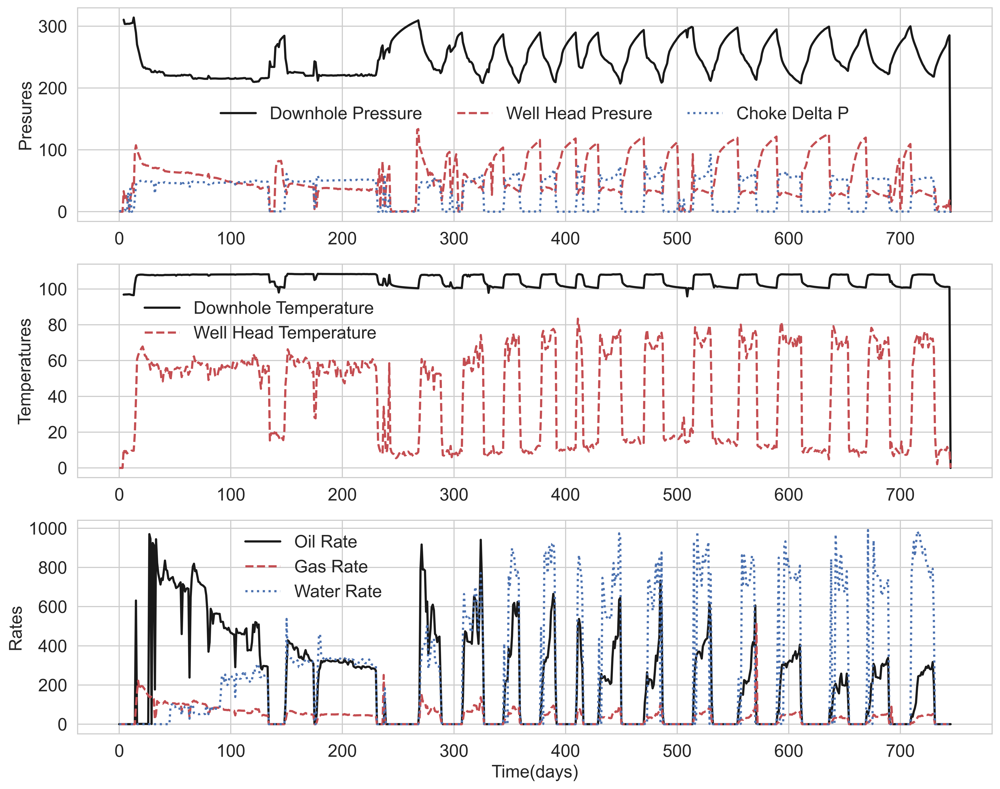

In [229]:
time = data_case['N']

plot_dict_P = {
'AVG_DOWNHOLE_PRESSURE':'Downhole Pressure',
'AVG_WHP_P':'Well Head Presure',
# 'AVG_DP_TUBING':'Tubing Delta P',
# 'AVG_ANNULUS_PRESS':'Annulus Pressure',
'AVG_CHOKE_SIZE_P':'Choke Delta P',
# 'DP_CHOKE_SIZE':'DP_CHOKE_SIZE_P',
}
plot_dict_T = {
'AVG_DOWNHOLE_TEMPERATURE':'Downhole Temperature',
'AVG_WHT_P':'Well Head Temperature',
}
plot_dict_Q = {
'BORE_OIL_VOL':'Oil Rate',
'BORE_GAS_VOL':'Gas Rate',
'BORE_WAT_VOL':'Water Rate',
}

fig, ax = plt.subplots(3,1, figsize=(15,12))

for k,v in plot_dict_P.items():
    ax[0].plot(time, data_case[k], label=v)

for k,v in plot_dict_T.items():
    ax[1].plot(time, data_case[k], label=v)

for k,v in plot_dict_Q.items():
    ax[2].plot(time, data_case[k], label=v)

ax[0].legend(ncol=3)
ax[0].set_ylabel('Presures')

ax[1].legend(bbox_to_anchor=(0.2,0.9))
ax[1].set_ylabel('Temperatures')

ax[2].legend(bbox_to_anchor=(0.35,0.55))
ax[2].set_ylabel('Rates')
ax[2].set_xlabel('Time(days)')

p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', 'resid_0_well_data.pdf')
fig.savefig(p, format='pdf',bbox_inches='tight')

pass;


In [7]:
data_case = data_case.iloc[28:,:]
data_case = data_case[filt_vars_IN_P + filt_vars_IN_T + filt_vars_OUT].dropna()
X1 = data_case[filt_vars_IN_P + filt_vars_IN_T].values
y =  data_case[filt_vars_OUT].values


# Preparação dos dodos

### Definindo a parcela de treino e de teste

In [8]:
p_train = 0.7 #70% treino


### Separando os conjuntos

In [9]:
n_train = int(X1.shape[0]*p_train)

X1_tr = X1[:n_train,:]
X1_te = X1[:,:]

y_tr = y[:n_train,:]
y_te = y[:,:]


In [10]:
print(
    X1.shape,
    X1_tr.shape,
    X1_te.shape
)
print(
    y.shape,
    y_tr.shape,
    y_te.shape,
)


(718, 5) (502, 5) (718, 5)
(718, 1) (502, 1) (718, 1)


### Removendo a escala 

In [11]:
s = MinMaxScaler()
X_tr = s.fit_transform(X1_tr)
X_te = s.fit_transform(X1_te)

y_tr = s.fit_transform(y_tr)
y_te = s.fit_transform(y_te)


# Declarando os modelos 

In [32]:
models = []


### Modelos de ML (sklearn)

#### Modelos

In [33]:
models_ml = [
    ('LinReg'          ,      LinearRegression(copy_X=True)), #ARX Equivalent
    ('PolyReg'         ,      Pipeline([('Poly', PolynomialFeatures(degree=2)), ('Reg', LinearRegression(copy_X=True))])), #NARX Equivalent
    ('SVM'             ,      SVR(max_iter=-1)),
    ('KNN'             ,      KNeighborsRegressor()),
    ('DecisionTree'    ,      DecisionTreeRegressor(random_state=rs)),
    ('RandomForest'    ,      RandomForestRegressor(random_state=rs)),
    ('GradientBoosting',      GradientBoostingRegressor(random_state=rs)),
    ('ExtraTrees'      ,      ExtraTreesRegressor(random_state=rs)),
    ('MLP'             ,      MLPRegressor(random_state=rs, )),
]

for i, m in enumerate(models_ml):
    # print (m[0])
    print (i, m[0])


0 LinReg
1 PolyReg
2 SVM
3 KNN
4 DecisionTree
5 RandomForest
6 GradientBoosting
7 ExtraTrees
8 MLP


#### Parâmetros (RandomSearchCV)

In [34]:

parameters = [
    {
        #'PCA__n_components'           : stats.uniform(loc=0.7, scale=0.3),
        'positive'                     : [True, False],
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'           : stats.uniform(loc=0.7, scale=0.3),
        'Reg__positive'                : [True, False],
        #'Poly__degree'                : [2, 3, 4, 5],
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'          : stats.uniform(loc=0.7, scale=0.3),
        'C'                     : stats.loguniform(1e-3, 1e3),
        'kernel'                : ['poly', 'rbf', 'sigmoid','linear'],
        'degree'                : stats.randint(2,6),
        'gamma'                 : stats.loguniform(1e-4, 1e0),
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'          : stats.uniform(loc=0.7, scale=0.3),
        'n_neighbors'           : stats.randint(1,100),
        'weights'               : ['uniform', 'distance'],
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'          : stats.uniform(loc=0.7, scale=0.3),
        #'DT__criterion'              : ['gini', 'entropy'],
        'splitter'               : ['best', 'random'],
        'max_depth'              : stats.randint(5,20), #maxima profundidade da arvore
        'min_samples_split'      : stats.randint(2,20), #minima quantidade de amostras para splitar
        'min_samples_leaf'       : stats.randint(1,20), #minima quantidade de amostras por folha
        'max_features'           : stats.uniform(),      #maxima quantidade de features para embasar a decisao de divisao
        'max_leaf_nodes'         : stats.randint(10,150), #maxima quantidade de folhas
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'          : stats.uniform(loc=0.7, scale=0.3),
        'n_estimators'           : stats.randint(5,100), #Numero de arvores
        #'RF__criterion'              : ['gini', 'entropy'],
        'max_depth'              : stats.randint(1,20), #maxima profundidade da arvore
        'min_samples_split'      : stats.randint(2,20), #minima quantidade de amostras para splitar
        'min_samples_leaf'       : stats.randint(1,20), #minima quantidade de amostras por folha
        'max_features'           : stats.uniform(),      #maxima quantidade de features para embasar a decisao de divisao
        'max_leaf_nodes'         : stats.randint(10,150), #maxima quantidade de folhas
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'          : stats.uniform(loc=0.7, scale=0.3),
        'n_estimators'           : stats.randint(5,100), #Numero de arvores
        'loss'                   : ['squared_error', 'absolute_error', 'huber', 'quantile'],
        'learning_rate'          : stats.loguniform(1e-5, 1e1),
        'criterion'              : ['friedman_mse', 'squared_error'],
        'subsample'              : stats.uniform(),
        #'RF__criterion'              : ['gini', 'entropy'],
        'max_depth'              : stats.randint(1,20), #maxima profundidade da arvore
        'min_samples_split'      : stats.randint(2,20), #minima quantidade de amostras para splitar
        'min_samples_leaf'       : stats.randint(1,20), #minima quantidade de amostras por folha
        'max_features'           : stats.uniform(),      #maxima quantidade de features para embasar a decisao de divisao
        'max_leaf_nodes'         : stats.randint(10,150), #maxima quantidade de folhas
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        #'PCA__n_components'          : stats.uniform(loc=0.7, scale=0.3),
        'n_estimators'           : stats.randint(5,100), #Numero de arvores
        'criterion'              : ['squared_error', 'absolute_error'],
        #'RF__criterion'              : ['gini', 'entropy'],
        'max_depth'              : stats.randint(1,20), #maxima profundidade da arvore
        'min_samples_split'      : stats.randint(2,20), #minima quantidade de amostras para splitar
        'min_samples_leaf'       : stats.randint(1,20), #minima quantidade de amostras por folha
        'max_features'           : stats.uniform(),      #maxima quantidade de features para embasar a decisao de divisao
        'max_leaf_nodes'         : stats.randint(10,150), #maxima quantidade de folhas
        #'expansor'                    : [None, PolynomialFeatures(degree=2)],
        #'nX'                          : stats.randint(2,10),
        #'ny'                          : stats.randint(2,10),
    },
    {
        'activation'            : ['relu'], #'logistic', 'tanh'],
        'early_stopping'        : [True, False],
        'alpha'                 : stats.loguniform(1e-4, 1e0),
        'hidden_layer_sizes'    : []
        + [n_neurons for n_neurons in itertools.product([20, 40, 60, 80, 100], repeat=1)]
        + [n_neurons for n_neurons in itertools.product([20, 40, 60, 80, 100], repeat=2)]
        + [n_neurons for n_neurons in itertools.product([20, 40, 60, 80, 100], repeat=3)]
        + [n_neurons for n_neurons in itertools.product([20, 40, 60, 80, 100], repeat=4)],
        'max_iter'              : [10000],#stats.randint(200,10000),
        'batch_size'            : [16, 32, 64, 128, 256],
        'solver'                : ['adam'], #'lbfgs'],
        'tol'                   : stats.loguniform(1e-7, 1e-1),

    },
]


### Setando Kfold e Random Search

In [35]:
kfolds = 5
niters = 4
rkf = RepeatedKFold(n_splits=kfolds, n_repeats=niters, random_state=71)


In [36]:
n_iter = 50 #Numero de iterações do rdmsearch

for model, params in zip(models_ml, parameters):
    rdmsearch = RandomizedSearchCV(model[1], verbose=0, scoring='r2',
                                   param_distributions=params, n_iter=n_iter, n_jobs=6,
                                   cv=rkf, random_state=rs)

    sidmodel = SYSIDRegressor(
        nX=6, ny=6,
        estimator=rdmsearch,
        preprocessor=MinMaxScaler(),
        #expansor=PolynomialFeatures(degree=2)
        )

    models.append(
        (model[0], sidmodel)
    )


# Treinamento

## Escolha dos modelos

In [37]:
# 0 LinReg
# 1 PolyReg
# 2 SVM
# 3 KNN
# 4 DecisionTree
# 5 RandomForest
# 6 GradientBoosting
# 7 ExtraTrees
# 8 MLP

for model in models:
    print (model[0])


LinReg
PolyReg
SVM
KNN
DecisionTree
RandomForest
GradientBoosting
ExtraTrees
MLP


## Escolha das ordens

In [38]:
orders = [4,5,6,9,12,20]
# orders = [2]


In [39]:
results_dict = {
    'MODEL1':[],
    'MODEL2':[],
    'ORDER':[],
    'R2_TRAIN_OSA':[],
    'R2_TEST_OSA':[],
    'R2_TRAIN_FS':[],
    'R2_TEST_FS':[],
    'R2_INC':[],
    'RMSE_TRAIN_OSA':[],
    'RMSE_TEST_OSA':[],
    'RMSE_TRAIN_FS':[],
    'RMSE_TEST_FS':[],
    'MODEL_OBJ1':[],
    'MODEL_OBJ2':[],
}


## Looping de treinamento e calculo das metricas

In [40]:
t00 = datetime.now()

#Loop principal, iterando sobre as listas
for order in orders:
    print(f'Order {order}')

    t0 = datetime.now()

    for model in models:

        # Training Step 1: full training set
        model_name, sidmodel = model
        print(f'Training Step 1: {model_name} ', end='')
        sidmodel.nX = order
        sidmodel.ny = order

        # train
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            sidmodel.fit(X=X1_tr, y=y_tr)

        # predictions
        y_hat_te_osa = sidmodel.predict(X1_te, y=y_te, steps_ahead=1)
        y_hat_tr_osa = sidmodel.predict(X1_tr, y=y_tr, steps_ahead=1)
        y_hat_te_fs  = sidmodel.predict(X1_te, y=y_te )
        y_hat_tr_fs  = sidmodel.predict(X1_tr, y=y_tr )

        # score
        r2_tr_osa = r2_score(y_tr,  y_hat_tr_osa)
        r2_te_osa = r2_score(y_te,  y_hat_te_osa)
        rmse_tr_osa = mean_squared_error(y_tr, y_hat_tr_osa)**0.5
        rmse_te_osa = mean_squared_error(y_te, y_hat_te_osa)**0.5
        try:
            r2_tr_fs = r2_score(y_tr, y_hat_tr_fs)
            r2_te_fs = r2_score(y_te, y_hat_te_fs)
            rmse_tr_fs = mean_squared_error(y_tr, y_hat_tr_fs)**0.5
            rmse_te_fs = mean_squared_error(y_te, y_hat_te_fs)**0.5
        except ValueError:
            r2_tr_fs = 1e290
            r2_te_fs = 1e290
            rmse_tr_fs = 1e290
            rmse_te_fs = 1e290

        # save and write
        results_dict['MODEL1'].append(model_name)
        results_dict['MODEL2'].append('-')
        results_dict['ORDER'].append(order)
        results_dict['R2_TRAIN_OSA'].append(r2_tr_osa)
        results_dict['R2_TEST_OSA'].append(r2_te_osa)
        results_dict['R2_TRAIN_FS'].append(r2_tr_fs)
        results_dict['R2_TEST_FS'].append(r2_te_fs)
        results_dict['R2_INC'].append(0)
        results_dict['RMSE_TRAIN_OSA'].append(rmse_tr_osa)
        results_dict['RMSE_TEST_OSA'].append(rmse_te_osa)
        results_dict['RMSE_TRAIN_FS'].append(rmse_tr_fs)
        results_dict['RMSE_TEST_FS'].append(rmse_te_fs)
        results_dict['MODEL_OBJ1'].append(deepcopy(sidmodel))
        results_dict['MODEL_OBJ2'].append(None)
        print(f'\t\tR2.OSA(Test)={r2_te_osa:.4f}, R2.FS(Test)={r2_te_fs:.4f}')

        # ###################################################
        # Training Step 2: training on train set residuals
        # ###################################################

        # residuals
        yr_tr = y_tr - y_hat_tr_osa
        yr_te = y_te - y_hat_te_osa

        for model_res in models:
            model_name_res, sidmodel_res  = model_res
            print(f'\t Step 2: +{model_name_res}', end='')
            sidmodel_res.nX = order
            sidmodel_res.ny = order

            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                sidmodel_res.fit(X=X1_tr, y=yr_tr)

            # predictions
            yr_hat_te_osa = sidmodel_res.predict(X1_te, y=yr_te, steps_ahead=1)
            yr_hat_tr_osa = sidmodel_res.predict(X1_tr, y=yr_tr, steps_ahead=1)
            try:
                yr_hat_te_fs  = sidmodel_res.predict(X1_te, y=yr_te)
                yr_hat_tr_fs  = sidmodel_res.predict(X1_tr, y=yr_tr)
            except ValueError:
                yr_hat_te_fs  = np.zeros(len(y_te))
                yr_hat_tr_fs  = np.zeros(len(y_te))
            # combined (final) predictions
            yf_hat_tr_osa = y_hat_tr_osa + yr_hat_tr_osa
            yf_hat_te_osa = y_hat_te_osa + yr_hat_te_osa
            yf_hat_tr_fs = y_hat_tr_fs + yr_hat_tr_fs
            yf_hat_te_fs = y_hat_te_fs + yr_hat_te_fs

            # score
            r2f_tr_osa = r2_score(y_tr,  yf_hat_tr_osa)
            r2f_te_osa = r2_score(y_te,  yf_hat_te_osa)
            rmsef_tr_osa = mean_squared_error(y_tr, yf_hat_tr_osa)**0.5
            rmsef_te_osa = mean_squared_error(y_te, yf_hat_te_osa)**0.5
            try:
                r2f_tr_fs = r2_score(y_tr, yf_hat_tr_fs)
                r2f_te_fs = r2_score(y_te, yf_hat_te_fs)
                rmsef_tr_fs = mean_squared_error(y_tr, yf_hat_tr_fs)**0.5
                rmsef_te_fs = mean_squared_error(y_te, yf_hat_te_fs)**0.5
            except ValueError:
                r2f_tr_fs = 1e290
                r2f_te_fs = 1e290
                rmsef_tr_fs = 1e290
                rmsef_te_fs = 1e290

            results_dict['MODEL1'].append(model_name)
            results_dict['MODEL2'].append(model_name_res)
            results_dict['ORDER'].append(order)
            results_dict['R2_TRAIN_OSA'].append(r2f_tr_osa)
            results_dict['R2_TEST_OSA'].append(r2f_te_osa)
            results_dict['R2_TRAIN_FS'].append(r2f_tr_fs)
            results_dict['R2_TEST_FS'].append(r2f_te_fs)
            results_dict['RMSE_TRAIN_OSA'].append(rmsef_tr_osa)
            results_dict['RMSE_TEST_OSA'].append(rmsef_te_osa)
            results_dict['RMSE_TRAIN_FS'].append(rmsef_tr_fs)
            results_dict['RMSE_TEST_FS'].append(rmsef_te_fs)
            results_dict['MODEL_OBJ1'].append(deepcopy(sidmodel))
            results_dict['MODEL_OBJ2'].append(deepcopy(sidmodel_res))
            r2_inc = 100*(r2f_te_fs/r2_te_fs-1)
            print(f'\t\tR2.OSA(Test)={r2f_te_osa:.4f}, R2.FS(Test)={r2f_te_fs:.4f}, R2 Increase={r2_inc:.2f}%')
            results_dict['R2_INC'].append(r2_inc)

        print()
    print(f'Tempo (ordem): {datetime.now()-t0}\nTempo (acum): {datetime.now()-t00}\n')


Order 4
Training Step 1: LinReg 		R2.OSA(Test)=0.7951, R2.FS(Test)=0.5924
	 Step 2: +LinReg		R2.OSA(Test)=0.7969, R2.FS(Test)=0.5926, R2 Increase=0.03%
	 Step 2: +PolyReg		R2.OSA(Test)=0.7998, R2.FS(Test)=0.5991, R2 Increase=1.14%
	 Step 2: +SVM		R2.OSA(Test)=0.7872, R2.FS(Test)=0.5805, R2 Increase=-2.00%
	 Step 2: +KNN		R2.OSA(Test)=0.9254, R2.FS(Test)=0.6096, R2 Increase=2.90%
	 Step 2: +DecisionTree		R2.OSA(Test)=0.8026, R2.FS(Test)=0.6119, R2 Increase=3.29%
	 Step 2: +RandomForest		R2.OSA(Test)=0.8492, R2.FS(Test)=0.6410, R2 Increase=8.20%
	 Step 2: +GradientBoosting		R2.OSA(Test)=0.8623, R2.FS(Test)=0.6648, R2 Increase=12.23%
	 Step 2: +ExtraTrees		R2.OSA(Test)=0.8421, R2.FS(Test)=0.6240, R2 Increase=5.34%
	 Step 2: +MLP		R2.OSA(Test)=0.7948, R2.FS(Test)=0.5918, R2 Increase=-0.09%

Training Step 1: PolyReg 		R2.OSA(Test)=0.8045, R2.FS(Test)=0.6600
	 Step 2: +LinReg		R2.OSA(Test)=0.8075, R2.FS(Test)=0.6603, R2 Increase=0.04%
	 Step 2: +PolyReg		R2.OSA(Test)=0.8071, R2.FS(Test)=0.66

In [41]:
df = pd.DataFrame(results_dict)
# df.sort_values('R2_TEST_FS')
df.sort_values('R2_TRAIN_FS', ascending=False)


,MODEL1,MODEL2,ORDER,R2_TRAIN_OSA,R2_TEST_OSA,R2_TRAIN_FS,R2_TEST_FS,R2_INC,RMSE_TRAIN_OSA,RMSE_TEST_OSA,RMSE_TRAIN_FS,RMSE_TEST_FS,MODEL_OBJ1,MODEL_OBJ2
272,LinReg,PolyReg,9,0.830718,0.810252,1.000000e+290,1.000000e+290,1.734739e+292,0.108576,0.119111,1.000000e+290,1.000000e+290,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
362,LinReg,PolyReg,12,0.844344,0.806583,1.000000e+290,1.000000e+290,1.732893e+292,0.104115,0.120257,1.000000e+290,1.000000e+290,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
532,MLP,PolyReg,20,0.898910,0.788553,1.000000e+290,1.000000e+290,1.552471e+292,0.083904,0.125737,1.000000e+290,1.000000e+290,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
422,GradientBoosting,PolyReg,12,0.920241,0.819571,1.000000e+290,1.000000e+290,1.421234e+292,0.074527,0.116149,1.000000e+290,1.000000e+290,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
312,DecisionTree,PolyReg,9,0.892384,0.781448,1.000000e+290,1.000000e+290,1.457303e+292,0.086570,0.127832,1.000000e+290,1.000000e+290,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,DecisionTree,DecisionTree,4,0.846829,0.811392,-5.892780e-01,-7.068637e-01,-1.906359e+00,0.103280,0.118752,3.326808e-01,3.572417e-01,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
49,DecisionTree,MLP,4,0.845429,0.810726,-6.078122e-01,-7.180358e-01,-3.559770e-01,0.103751,0.118962,3.346151e-01,3.584090e-01,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
40,DecisionTree,-,4,0.845432,0.810739,-6.101291e-01,-7.206010e-01,0.000000e+00,0.103750,0.118958,3.348561e-01,3.586764e-01,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
43,DecisionTree,SVM,4,0.845392,0.810740,-6.187258e-01,-7.301101e-01,1.319610e+00,0.103763,0.118957,3.357488e-01,3.596662e-01,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...


Trocando valores expurios por NaN

In [42]:
df2 = df.copy()
df2.loc[df['R2_TEST_FS']<-2, ['R2_TRAIN_OSA','R2_TEST_OSA','R2_TRAIN_FS','R2_TEST_FS','R2_INC']] = np.nan
df2.loc[df['R2_TEST_FS']>1, ['R2_TRAIN_OSA','R2_TEST_OSA','R2_TRAIN_FS','R2_TEST_FS','RMSE_TRAIN_FS','RMSE_TEST_FS','R2_INC']] = np.nan
df2.sort_values('R2_TEST_FS')


,MODEL1,MODEL2,ORDER,R2_TRAIN_OSA,R2_TEST_OSA,R2_TRAIN_FS,R2_TEST_FS,R2_INC,RMSE_TRAIN_OSA,RMSE_TEST_OSA,RMSE_TRAIN_FS,RMSE_TEST_FS,MODEL_OBJ1,MODEL_OBJ2
43,DecisionTree,SVM,4,0.845392,0.810740,-0.618726,-0.730110,1.319610,0.103763,0.118957,0.335749,0.359666,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
40,DecisionTree,-,4,0.845432,0.810739,-0.610129,-0.720601,0.000000,0.103750,0.118958,0.334856,0.358676,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
49,DecisionTree,MLP,4,0.845429,0.810726,-0.607812,-0.718036,-0.355977,0.103751,0.118962,0.334615,0.358409,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
47,DecisionTree,GradientBoosting,4,0.900036,0.849633,-0.561919,-0.708172,-1.724741,0.083435,0.106033,0.329805,0.357379,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
45,DecisionTree,DecisionTree,4,0.846829,0.811392,-0.589278,-0.706864,-1.906359,0.103280,0.118752,0.332681,0.357242,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,DecisionTree,PolyReg,20,NaN,NaN,NaN,NaN,NaN,0.092474,0.146562,NaN,NaN,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
502,RandomForest,PolyReg,20,NaN,NaN,NaN,NaN,NaN,0.051543,0.176149,NaN,NaN,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
512,GradientBoosting,PolyReg,20,NaN,NaN,NaN,NaN,NaN,0.059570,0.200427,NaN,NaN,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
522,ExtraTrees,PolyReg,20,NaN,NaN,NaN,NaN,NaN,0.043990,0.319380,NaN,NaN,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...


Criando Flag de treinamento em 2 steps

In [43]:
df2['STEPS'] = '2'
df2.loc[df2['MODEL2']=='-', ['STEPS']] = '1'
df2.value_counts('STEPS')

STEPS
2    486
1     54
Name: count, dtype: int64

Renomenado modelos pra facilitar nos plots

In [44]:
df2.rename(columns={'MODEL1':'BASE_MODEL', 'MODEL2':'RESIDUAL_MODEL'}, inplace=True)

#### Salvando

In [45]:
prefix = 'RESID.MISO.W1_V2'
binary = os.path.join(os.getcwd(), 'outputs', f'{prefix}_ml.pkl')
print(binary)

with open(binary, 'wb') as bin_file:
    pickle.dump((X1_tr, y_tr, X1_te, y_te, results_dict, df, df2), bin_file)


c:\Users\bewm\OneDrive - PETROBRAS\Documents\2_Projetos\Mestrado\SYSID_Trabalho\Volve-Dataset\outputs\RESID.MISO.W1_V2_ml.pkl


# Analysis

([<matplotlib.axis.XTick at 0x24d307ac550>,
 [Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(9, 0, '9'),
  Text(12, 0, '12'),
  Text(20, 0, '20')])

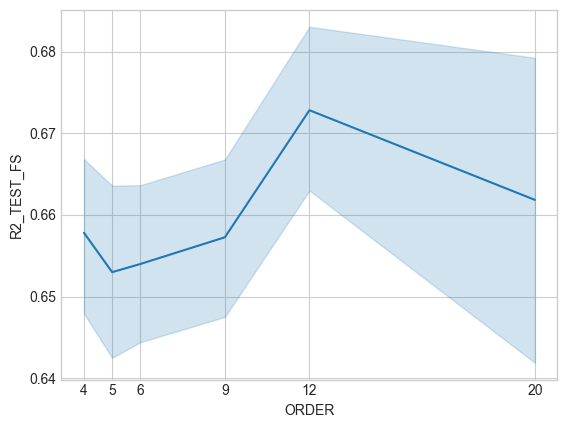

In [55]:
# plt.style.use(['seaborn-v0_8-whitegrid'])
# plt.style.use(['seaborn-whitegrid'])
# sns.lineplot(data=df2[~df2['BASE_MODEL']=='DecisionTree'], x='ORDER', y='R2_TEST_FS')
sns.lineplot(data=df2[df2['BASE_MODEL'] != 'DecisionTree'], x='ORDER', y='R2_TEST_FS')
plt.xticks(orders)


<Axes: xlabel='R2_TEST_FS', ylabel='Density'>

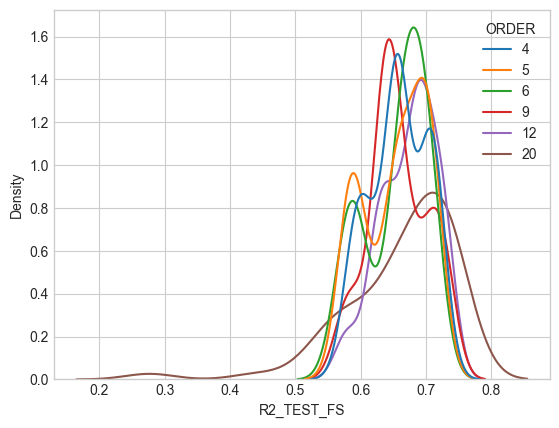

In [57]:
sns.kdeplot(data=df2[(df2['BASE_MODEL'] != 'DecisionTree') & (df2['RESIDUAL_MODEL'] != 'DecisionTree')], x='R2_TEST_FS', hue='ORDER', palette='tab10')


Text(0.5, 0, 'Order')

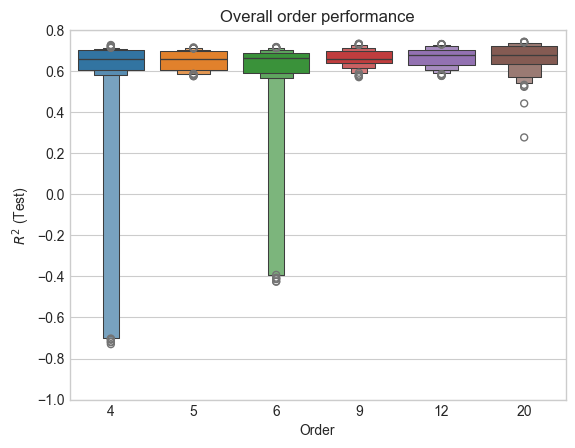

In [58]:
# sns.boxplot(data=df2, x='ORDER', y='R2_TEST_FS',showmeans=False, meanprops={"marker":"o","markerfacecolor":"white","markeredgecolor":"black", "markersize":8},)
# ax = sns.boxenplot(data=df2[(df2['BASE_MODEL'] != 'DecisionTree') & (df2['RESIDUAL_MODEL'] != 'DecisionTree')], x='ORDER', y='R2_TEST_FS', palette='tab10')
ax = sns.boxenplot(data=df2, x='ORDER', y='R2_TEST_FS', palette='tab10')
plt.ylim([-1,.8])
plt.title("Overall order performance")
plt.ylabel('$R^2$ (Test)')
plt.xlabel('Order')

# p = os.path.join(os.getcwd(), 'outputs', 'images_decomposition', '2_boxplot_order_R2.eps')
# ax.get_figure().savefig(p, format='eps')


Reultados

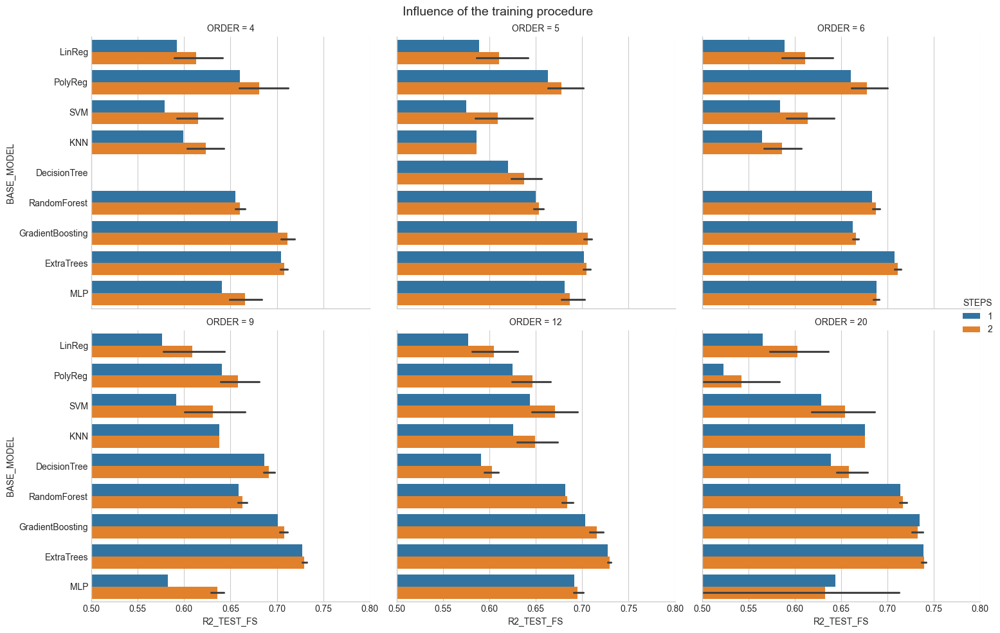

In [59]:
c = sns.catplot(data=df2, x='R2_TEST_FS', y='BASE_MODEL', hue='STEPS', col='ORDER', col_wrap=3, errorbar=('ci',100), kind='bar', palette='tab10')

c.fig.suptitle('Influence of the training procedure', size=14)
c.fig.subplots_adjust(top=.90)
plt.xlim([.50,.80])
plt.tight_layout()

# p = os.path.join(os.getcwd(), 'outputs', 'images_decomposition', '3_catplot_2stepTraining.eps')
# c.fig.savefig(p, format='eps')


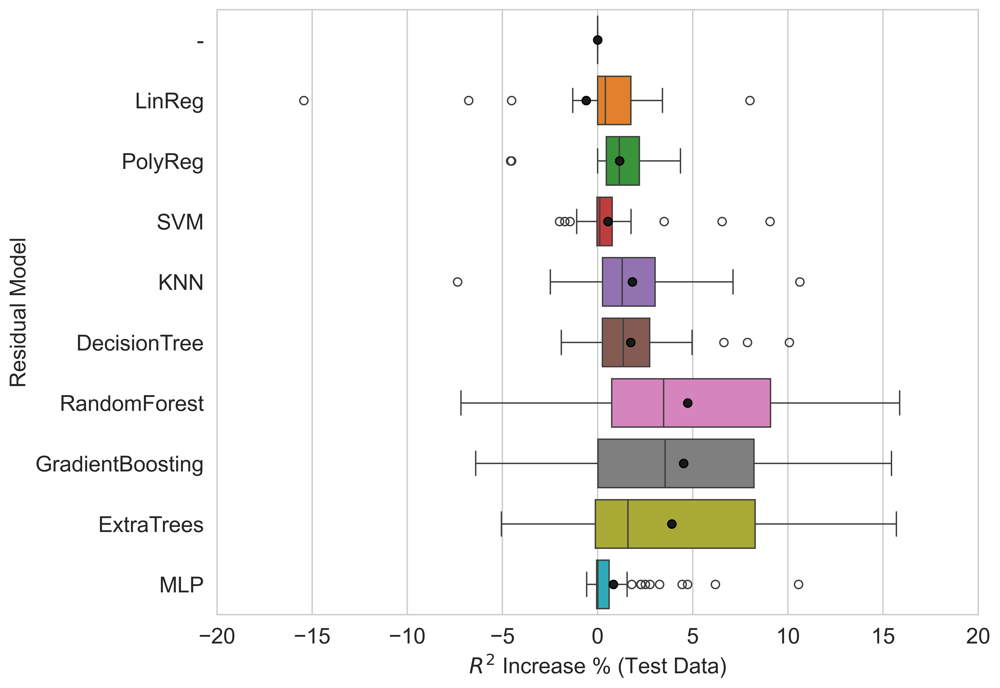

In [228]:
# sns.boxplot(data=df2[(df2['BASE_MODEL'] != 'DecisionTree') & (df2['RESIDUAL_MODEL'] != 'DecisionTree')], y='RESIDUAL_MODEL', x='R2_INC', palette='tab10', showmeans=True,  meanprops={"marker":"o","markerfacecolor":"k", "markeredgecolor":"black"})

fig = plt.figure(figsize=(10,8))
sns.boxplot(data=df2, y='RESIDUAL_MODEL', x='R2_INC', palette='tab10', showmeans=True,  meanprops={"marker":"o","markerfacecolor":"k", "markeredgecolor":"black"})
plt.xlabel('$R^2$ Increase % (Test Data)')
plt.ylabel('Residual Model')

plt.xlim([-20,20])

p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', 'resid_1_box_residual_models.pdf')
fig.savefig(p, format='pdf', bbox_inches='tight')


In [232]:
lim=(.4,.75)
fig, ax = plt.subplots(3,3, figsize=(15,15))

ax = ax.flatten()
sns.set(font_scale=0.8)
plt.style.use(['seaborn-v0_8-whitegrid'])
# fig.suptitle('Training and Test score for all models and orders', fontsize=14)
fig.subplots_adjust(top=.95)

for i,m in enumerate(models_ml):
    sns.lineplot(data=df2[df2['BASE_MODEL']==m[0]], x='ORDER',  y='R2_TEST_FS', hue='STEPS', ax=ax[i], errorbar='pi')
    ax[i].set_ylim(lim)
    ax[i].set_title(f'Model:{m[0]}')
    ax[i].set_xlabel('Lag')
    ax[i].set_xticks(orders)
    ax[i].set_ylabel(f'$R^2$ FS Test (Full time series)')
    ax[i].legend(title='Training Steps')
pass;


p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', 'resid_2_lineplots.pdf')
fig.savefig(p, format='pdf', bbox_inches='tight')

Swarm Plots misturando as ordens

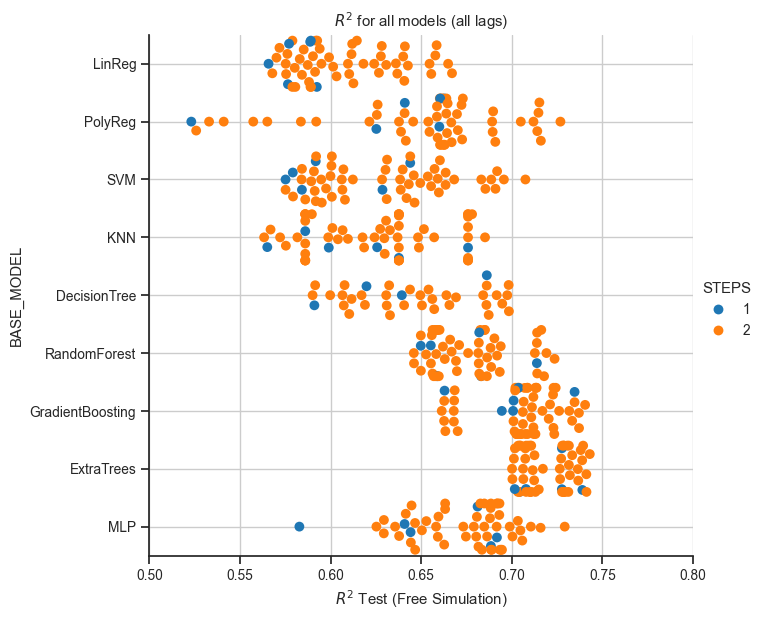

In [94]:

sns.set(font_scale=.9, style='ticks')

# catplot = sns.catplot(data=df2[~df2.BASE_MODEL.isin(['DecisionTree'])], y='BASE_MODEL', x='R2_TEST_FS', hue='STEPS', kind='swarm', height=6, aspect=1.2, s=50, palette='tab10')
catplot = sns.catplot(data=df2, y='BASE_MODEL', x='R2_TEST_FS', hue='STEPS', kind='swarm', height=6, aspect=1.2, s=50, palette='tab10')
plt.xlim((.5,.8))
plt.grid()
plt.xlabel('$R^2$ Test (Free Simulation)')
plt.title('$R^2$ for all models (all lags)')
pass;

# fig = catplot.fig
# p = os.path.join(os.getcwd(), 'outputs', 'images_ensembles', '3_r2_swarm.eps')
# fig.savefig(p, format='eps')


ScatterPlot variando as ordens

In [233]:
lim=(.5,.8)
fig, ax = plt.subplots(2,3, figsize=(18,12))

ax = ax.flatten()

# fig.suptitle('Training and Test (Full series) for all models and orders', fontsize=16)

for i,o in enumerate (orders):
# for i,o in enumerate (orders[:-2]):
    sns.scatterplot(data=df2[df['ORDER']==o], x='R2_TRAIN_FS', y='R2_TEST_FS', hue='BASE_MODEL', ax=ax[i], size='STEPS', style='STEPS', sizes=(100,250), palette='tab10');
    ax[i].plot(lim, lim, '--', c='k')
    ax[i].set_xlim(lim)
    ax[i].set_ylim(lim)
    ax[i].set_title(f'Lag:{o}')
    ax[i].set_xlabel(f'$R^2$ FS (Train)')
    ax[i].set_ylabel(f'$R^2$ FS (Total Data)')
    ax[i].legend(fontsize=10, markerscale=1.2,)


p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', 'resid_3_crossplots.pdf')
fig.savefig(p, format='pdf', bbox_inches='tight')

pass;


Tabela resumo dos resultados

MELHORES MODELOS

In [132]:
bst = df2.sort_values(['R2_TEST_FS'],ascending=False).drop_duplicates(['BASE_MODEL'])[['BASE_MODEL', 'RESIDUAL_MODEL', 'ORDER', 'R2_TEST_FS', 'RMSE_TEST_FS']]
bst


,BASE_MODEL,RESIDUAL_MODEL,ORDER,R2_TEST_FS,RMSE_TEST_FS
526,ExtraTrees,RandomForest,20,0.743022,0.138615
513,GradientBoosting,SVM,20,0.740433,0.139312
538,MLP,ExtraTrees,20,0.729190,0.142297
18,PolyReg,ExtraTrees,4,0.726825,0.142917
505,RandomForest,DecisionTree,20,0.723599,0.143758
387,SVM,GradientBoosting,12,0.707503,0.147885
311,DecisionTree,LinReg,9,0.698396,0.150169
396,KNN,RandomForest,12,0.685218,0.153415
278,LinReg,ExtraTrees,9,0.666992,0.157794


In [133]:
bst_tup = bst[['BASE_MODEL', 'ORDER']].apply(tuple, axis=1)
bst_tup


526          (ExtraTrees, 20)
513    (GradientBoosting, 20)
538                 (MLP, 20)
18               (PolyReg, 4)
505        (RandomForest, 20)
387                 (SVM, 12)
311         (DecisionTree, 9)
396                 (KNN, 12)
278               (LinReg, 9)
dtype: object

MELHORES MODELOS 1 STEP CORRESPONDENTES

In [134]:
corresp = df2[df2[['BASE_MODEL','ORDER']].apply(tuple,1).isin(bst_tup)]
corresp = corresp[corresp['STEPS']=='1'][['BASE_MODEL', 'RESIDUAL_MODEL', 'ORDER', 'R2_TEST_FS', 'RMSE_TEST_FS']]
corresp


,BASE_MODEL,RESIDUAL_MODEL,ORDER,R2_TEST_FS,RMSE_TEST_FS
10,PolyReg,-,4,0.660006,0.159440
270,LinReg,-,9,0.576456,0.177956
310,DecisionTree,-,9,0.686199,0.153176
380,SVM,-,12,0.643934,0.163165
390,KNN,-,12,0.625680,0.167296
500,RandomForest,-,20,0.713824,0.146278
510,GradientBoosting,-,20,0.734636,0.140859
520,ExtraTrees,-,20,0.738922,0.139716
530,MLP,-,20,0.644135,0.163119


In [135]:
bst2 = bst.merge(corresp, on='BASE_MODEL', how='left', suffixes=('(2step)', '(base)')).drop(['RESIDUAL_MODEL(base)', 'ORDER(base)'], axis=1)
bst2['R2_%'] = 100*(bst2['R2_TEST_FS(2step)']/bst2['R2_TEST_FS(base)']-1).round(decimals=3)
bst2['RMSE_%'] = 100*(1-bst2['RMSE_TEST_FS(2step)']/bst2['RMSE_TEST_FS(base)']).round(decimals=3)
bst2.rename(columns={'RESIDUAL_MODEL(2step)':'RESIDUAL_MODEL', 'ORDER(2step)':'ORDER'}, inplace=True)

# reordenando
bst2 = bst2.iloc[:, [0,1,2,3,5,7,4,6,8]]
bst2.to_clipboard()
bst2


,BASE_MODEL,RESIDUAL_MODEL,ORDER,R2_TEST_FS(2step),R2_TEST_FS(base),R2_%,RMSE_TEST_FS(2step),RMSE_TEST_FS(base),RMSE_%
0,ExtraTrees,RandomForest,20,0.743022,0.738922,0.6,0.138615,0.139716,0.8
1,GradientBoosting,SVM,20,0.740433,0.734636,0.8,0.139312,0.140859,1.1
2,MLP,ExtraTrees,20,0.729190,0.644135,13.2,0.142297,0.163119,12.8
3,PolyReg,ExtraTrees,4,0.726825,0.660006,10.1,0.142917,0.159440,10.4
4,RandomForest,DecisionTree,20,0.723599,0.713824,1.4,0.143758,0.146278,1.7
5,SVM,GradientBoosting,12,0.707503,0.643934,9.9,0.147885,0.163165,9.4
6,DecisionTree,LinReg,9,0.698396,0.686199,1.8,0.150169,0.153176,2.0
7,KNN,RandomForest,12,0.685218,0.625680,9.5,0.153415,0.167296,8.3
8,LinReg,ExtraTrees,9,0.666992,0.576456,15.7,0.157794,0.177956,11.3


heatmap nas melhores ordens de cada combinação

In [120]:
# sort order
sorter = [m[0] for m in models]
sorter


['LinReg',
 'PolyReg',
 'SVM',
 'KNN',
 'DecisionTree',
 'RandomForest',
 'GradientBoosting',
 'ExtraTrees',
 'MLP']

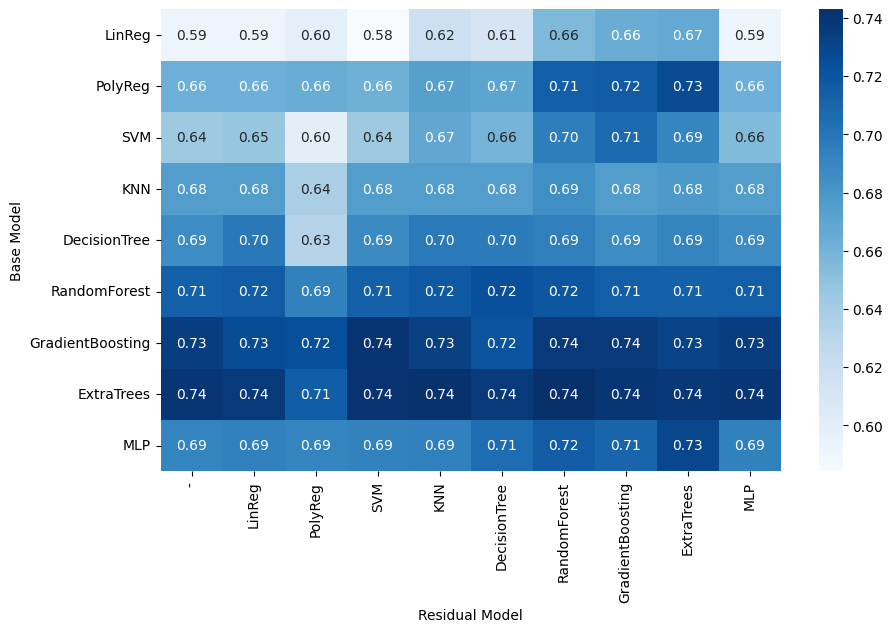

In [234]:
# dfhm = df2[df2[['BASE_MODEL','ORDER']].apply(tuple,1).isin(bst_tup)]    #filtra pela tupla
# dfhm = dfhm[['BASE_MODEL', 'RESIDUAL_MODEL', 'ORDER', 'R2_TEST_FS', 'RMSE_TEST_FS']]
# dfhm['BASE_MODEL'] = dfhm['BASE_MODEL'] + '(n=' + dfhm['ORDER'].astype(str) +')'
# dfhm
plt.rcdefaults()
dfhm = df2.sort_values('R2_TEST_FS', ascending=False).drop_duplicates(['BASE_MODEL', 'RESIDUAL_MODEL'])

dfhm = dfhm.pivot(columns='RESIDUAL_MODEL', index='BASE_MODEL', values='R2_TEST_FS').reindex(sorter)
dfhm = dfhm.iloc[:, [0,5,7,9,4,1,8,3,2,6]]
# dfhm
fig = plt.figure(figsize=(10,6))
sns.heatmap(data=dfhm, annot=True, fmt='.2f', cmap='Blues');
plt.xlabel('Residual Model')
plt.ylabel('Base Model')
pass;

p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', 'resid_4_heatmap.pdf')
fig.savefig(p, format='pdf', bbox_inches='tight')

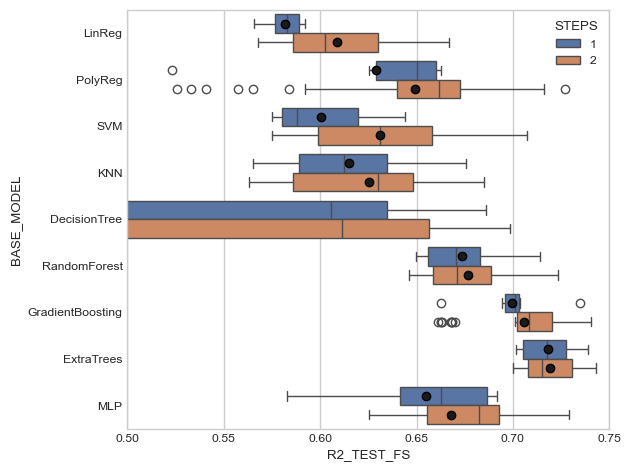

In [235]:
sns.set(font_scale=0.8)
plt.style.use(['seaborn-v0_8-whitegrid'])

# sns.boxplot(data=df2[~df2.BASE_MODEL.isin(['DecisionTree'])], hue='STEPS', x='R2_TEST_FS', y='BASE_MODEL', showmeans=True, meanprops={"marker":"o","markerfacecolor":"k", "markeredgecolor":"black"}, width=0.8)
sns.boxplot(data=df2, hue='STEPS', x='R2_TEST_FS', y='BASE_MODEL', showmeans=True, meanprops={"marker":"o","markerfacecolor":"k", "markeredgecolor":"black"}, width=0.8)
# plt.title('Influence of the training procedure')
plt.xlim((.5,.75))
plt.tight_layout()

p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', 'resid_5_boxplots.pdf')
plt.savefig(p, format='pdf', bbox_inches='tight')
pass;


Predictions

Ranqueamento dos melhores casos

In [161]:
bst = df2.sort_values(['R2_TEST_FS'],ascending=False).drop_duplicates(['BASE_MODEL'])[['BASE_MODEL', 'RESIDUAL_MODEL', 'ORDER', 'R2_TEST_FS', 'MODEL_OBJ1', 'MODEL_OBJ2']]
bst

,BASE_MODEL,RESIDUAL_MODEL,ORDER,R2_TEST_FS,MODEL_OBJ1,MODEL_OBJ2
526,ExtraTrees,RandomForest,20,0.743022,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
513,GradientBoosting,SVM,20,0.740433,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
538,MLP,ExtraTrees,20,0.729190,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
18,PolyReg,ExtraTrees,4,0.726825,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
505,RandomForest,DecisionTree,20,0.723599,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
387,SVM,GradientBoosting,12,0.707503,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
311,DecisionTree,LinReg,9,0.698396,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
396,KNN,RandomForest,12,0.685218,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
278,LinReg,ExtraTrees,9,0.666992,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...


In [163]:
corresp = df2[df2[['BASE_MODEL','ORDER']].apply(tuple,1).isin(bst_tup)]
corresp = corresp[corresp['STEPS']=='1'][bst.columns]
corresp


,BASE_MODEL,RESIDUAL_MODEL,ORDER,R2_TEST_FS,MODEL_OBJ1,MODEL_OBJ2
10,PolyReg,-,4,0.660006,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
270,LinReg,-,9,0.576456,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
310,DecisionTree,-,9,0.686199,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
380,SVM,-,12,0.643934,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
390,KNN,-,12,0.625680,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
500,RandomForest,-,20,0.713824,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
510,GradientBoosting,-,20,0.734636,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
520,ExtraTrees,-,20,0.738922,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
530,MLP,-,20,0.644135,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None


In [210]:
df_rank = pd.concat([bst, corresp]).sort_values(['BASE_MODEL', 'RESIDUAL_MODEL'])
df_rank

,BASE_MODEL,RESIDUAL_MODEL,ORDER,R2_TEST_FS,MODEL_OBJ1,MODEL_OBJ2
310,DecisionTree,-,9,0.686199,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
311,DecisionTree,LinReg,9,0.698396,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
520,ExtraTrees,-,20,0.738922,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
526,ExtraTrees,RandomForest,20,0.743022,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
510,GradientBoosting,-,20,0.734636,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
513,GradientBoosting,SVM,20,0.740433,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
390,KNN,-,12,0.625680,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
396,KNN,RandomForest,12,0.685218,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...
270,LinReg,-,9,0.576456,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,None
278,LinReg,ExtraTrees,9,0.666992,SYSIDRegressor(estimator=RandomizedSearchCV(cv...,SYSIDRegressor(estimator=RandomizedSearchCV(cv...


In [214]:
indexes_best = df_rank.index.to_list()
pairs = [(indexes_best[a], indexes_best[a+1]) for a in range(0,len(indexes_best),2)]
pairs


[(310, 311),
 (520, 526),
 (510, 513),
 (390, 396),
 (270, 278),
 (530, 538),
 (10, 18),
 (500, 505),
 (380, 387)]

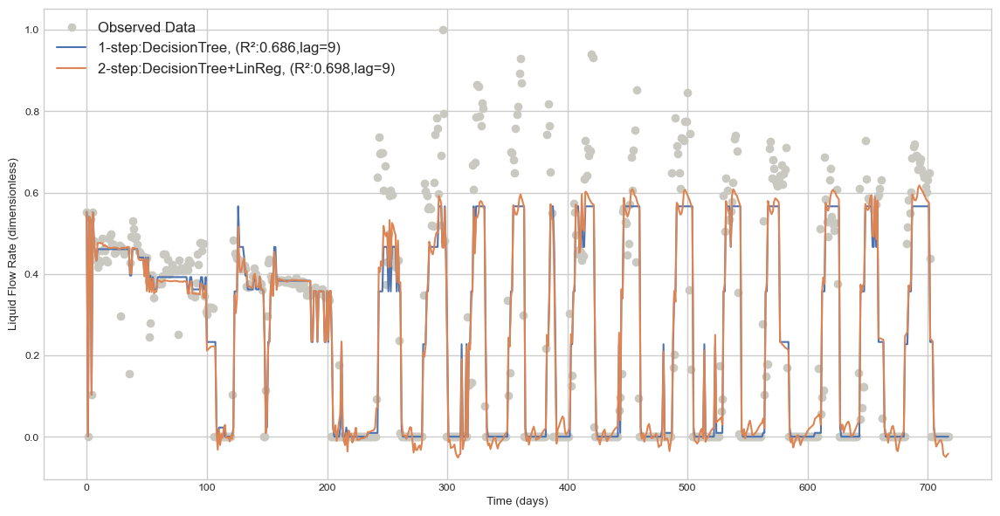

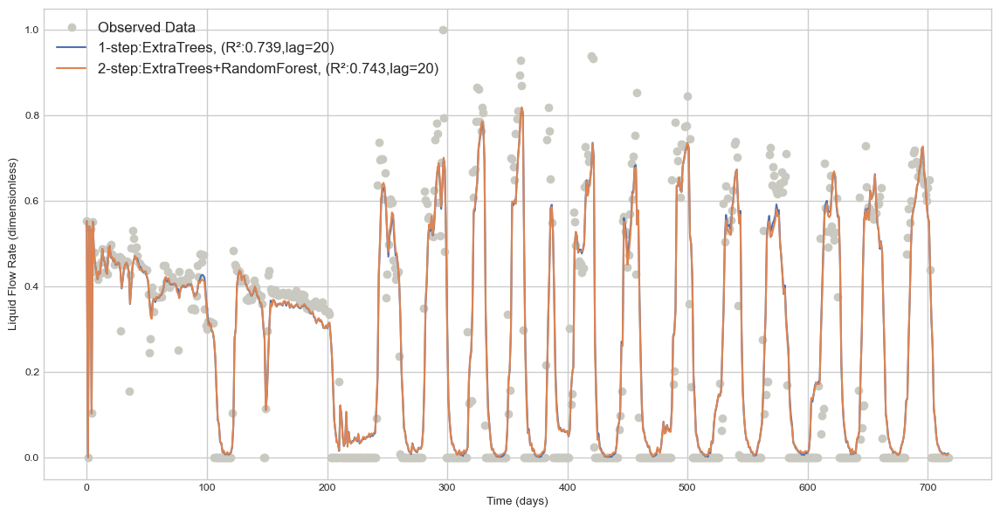

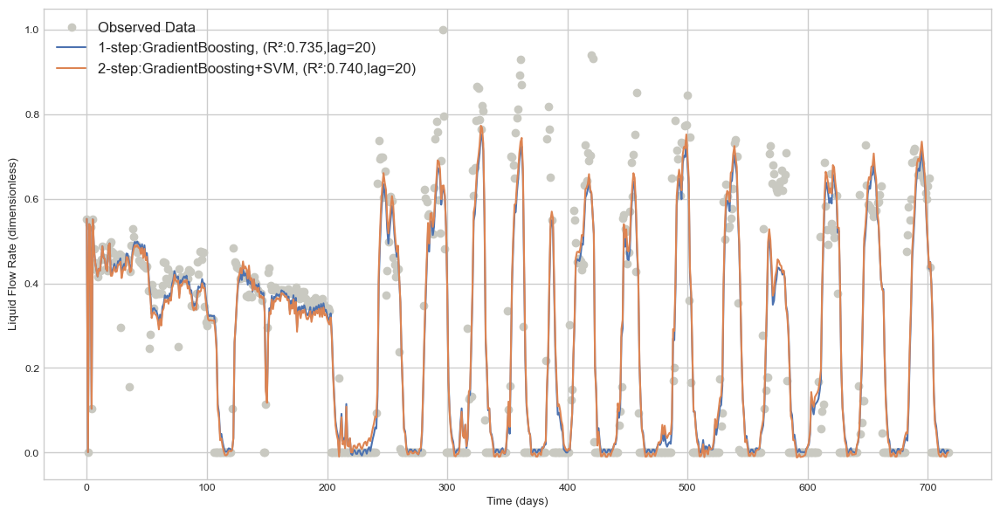

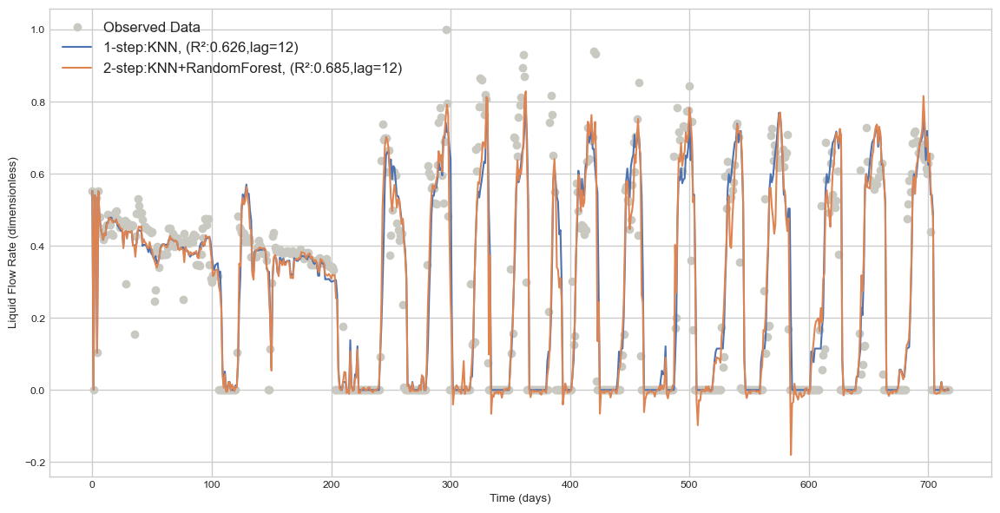

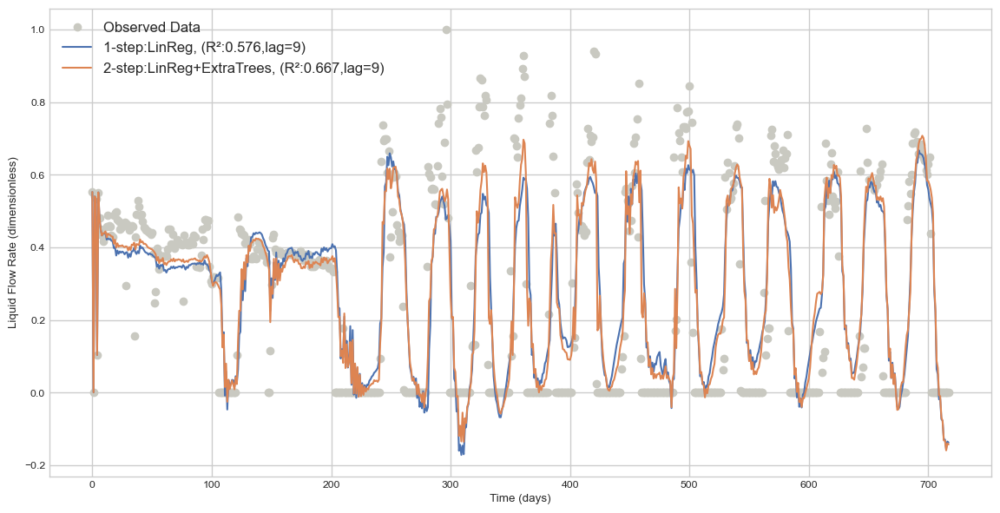

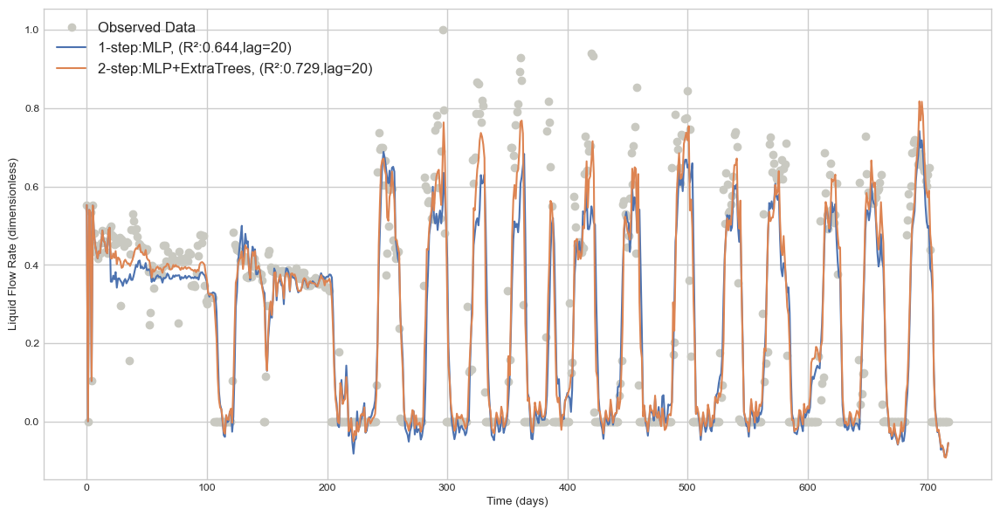

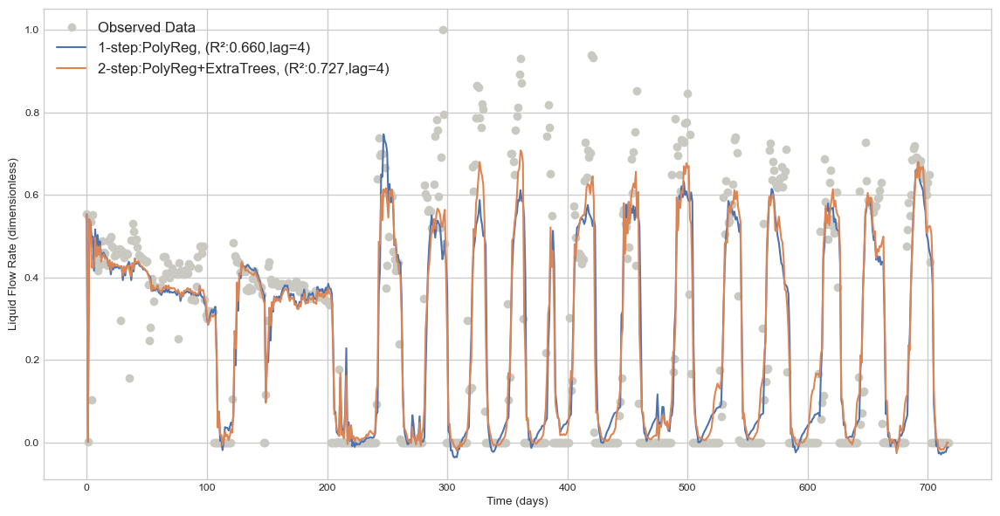

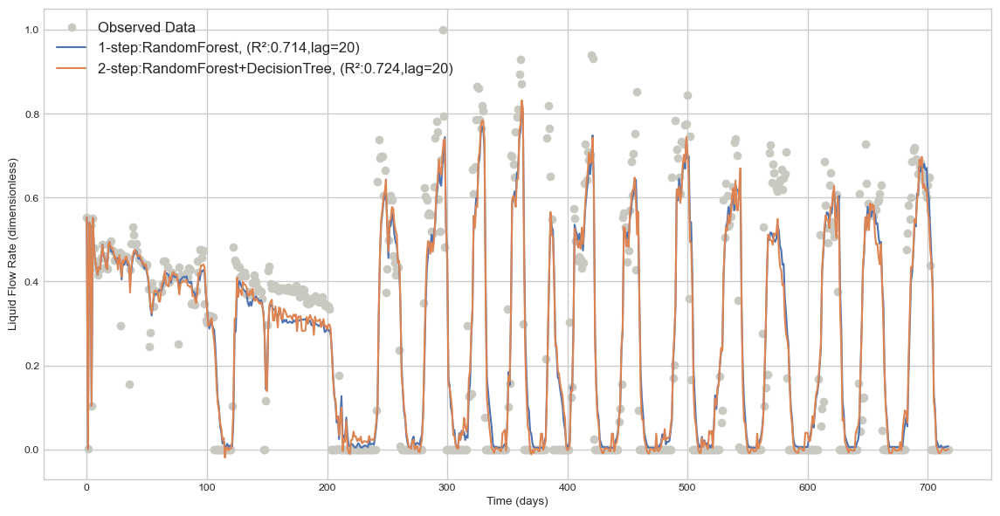

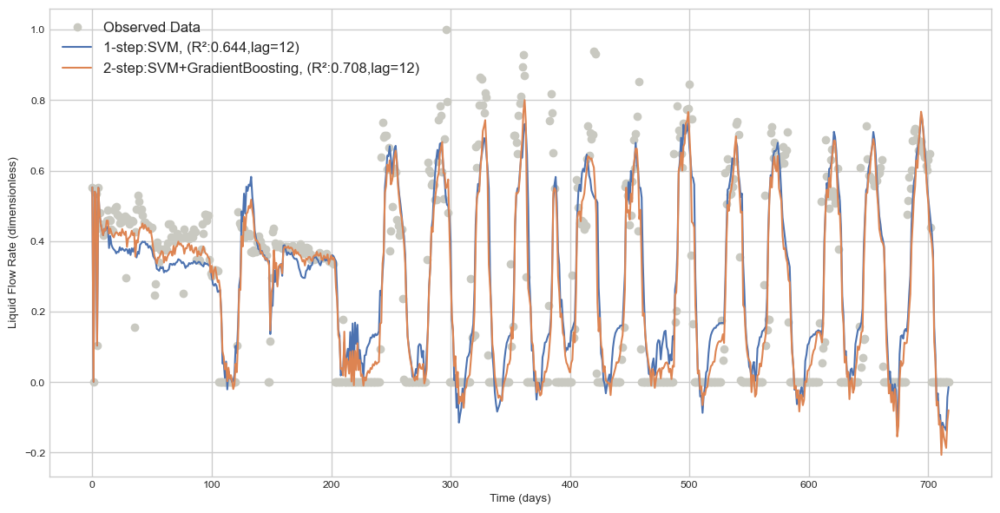

In [239]:
for pair in pairs:
    baseindex = pair[0]
    residindex = pair[1]

    # predictions
    y_hat_te_fs = df_rank.loc[baseindex,'MODEL_OBJ1'].predict(X1_te, y=y_te)
    y_hat_te_osa = df_rank.loc[baseindex,'MODEL_OBJ1'].predict(X1_te, y=y_te, steps_ahead=1)
    # residuals
    yr_te = y_te - y_hat_te_osa
    # residual predictions
    yr_hat_te_fs  = df_rank.loc[residindex,'MODEL_OBJ2'].predict(X1_te, y=yr_te)
    # combined (full) predictions
    yf_hat_te_fs = y_hat_te_fs + yr_hat_te_fs

    fig = plt.figure(figsize=(14,7))
    plt.plot(y_te, 'o', label='Observed Data', c='#c9c9c1')

    # plot best modl predictions
    plt.plot(y_hat_te_fs, label=f"1-step:{df_rank.loc[baseindex,'BASE_MODEL']}, (R²:{df_rank.loc[baseindex,'R2_TEST_FS']:.3f},lag={df_rank.loc[baseindex,'ORDER']})")
    plt.plot(yf_hat_te_fs, label=f"2-step:{df_rank.loc[residindex,'BASE_MODEL']}+{df_rank.loc[residindex,'RESIDUAL_MODEL']}, (R²:{df_rank.loc[residindex,'R2_TEST_FS']:.3f},lag={df_rank.loc[residindex,'ORDER']})")
    plt.legend()

    plt.ylabel('Liquid Flow Rate (dimensionless)')
    plt.xlabel('Time (days)')
    plt.legend(fontsize='12', loc='upper left')
    # plt.title('Liquid Rate Models Predictions x Observed Data (best model)')

    p = os.path.join(os.getcwd(), 'outputs', 'images_residuals', f"resid_6_pred_{df_rank.loc[baseindex,'BASE_MODEL']}.pdf")
    fig.savefig(p, format='pdf', bbox_inches='tight')
    pass;

#### Estudos dos tempos e parametros (parei por aqui)

parametros dos melhores modelos

In [ ]:
for i,m in enumerate(df_rank['MODEL_OBJ']):
    print (i+1, end=',')
    if m.estimator.cv == 'prefit': #stack
        # print (m.estimator.final_estimator_.cv_results_['params'])
        print (m.estimator.final_estimator_.best_estimator_)
    else: #no stack
        # print (m.estimator.cv_results_['params'])
        print (m.estimator.best_estimator_)


In [ ]:
for i,m in enumerate(df_rank['MODEL_OBJ']):
    # print (i+1, end=',')
    if m.estimator.cv == 'prefit': #stack
        estim_cvr = m.estimator.final_estimator_.cv_results_
    else: #no stack
        estim_cvr = m.estimator.cv_results_
    print (f"{np.mean(estim_cvr['mean_fit_time'])*1000:.0f}")


# plt.plot(best_pred, label=f"{df_rank.loc[0,'MODEL']}, (R²:{df_rank.loc[0,'R2_TEST_FS']:.2f}, lag:{df_rank.loc[0,'ORDER']})")
